In [1]:
# %pip install antspyx nilearn

In [2]:
%load_ext autoreload
%autoreload 2
import os, sys
os.environ["CUDA_VISIBLE_DEVICES"] = "1"
project_dir = "../braintypicality"
sys.path.append(project_dir)

In [3]:
import re
import functools
import glob
import math
import ants
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from tqdm.auto import tqdm
from functools import partial
from nilearn import datasets, plotting
import os 

/ASD2/emre_projects/miniconda3/envs/myenv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [4]:
CACHE_DIR = "../braintypicality/dataset/template_cache/"

procd_ref_img_path = f"{CACHE_DIR}/cropped_niral_mni.nii.gz"

if not os.path.exists(procd_ref_img_path):
    T1_REF_IMG_PATH = os.path.join(
        CACHE_DIR, "mni_icbm152_09a/mni_icbm152_t1_tal_nlin_sym_09a.nrrd"
    )
    T2_REF_IMG_PATH = os.path.join(
        CACHE_DIR, "mni_icbm152_09a/mni_icbm152_t2_tal_nlin_sym_09a.nrrd"
    )
    MASK_REF_IMG_PATH = os.path.join(
        CACHE_DIR, "mni_icbm152_09a/mni_icbm152_t1_tal_nlin_sym_09a_mask.nrrd"
    )

    ants_mni = ants.image_read(f"{CACHE_DIR}/croppedMni152.nii.gz")
    t1_ref_img = ants.image_read(T1_REF_IMG_PATH)
    t2_ref_img = ants.image_read(T2_REF_IMG_PATH)
    ref_img_mask = ants.image_read(MASK_REF_IMG_PATH)

    # Use ANTs' tighter cropping
    diff = np.array(t1_ref_img.shape) - np.array(ants_mni.shape)
    crop_idxs_start, crop_idxs_end = 1 + diff // 2, np.array(t1_ref_img.shape) - diff // 2

    t1_ref_img = ants.crop_indices(t1_ref_img, crop_idxs_start, crop_idxs_end)
    t2_ref_img = ants.crop_indices(t2_ref_img, crop_idxs_start, crop_idxs_end)
    ref_img_mask = ants.crop_indices(ref_img_mask, crop_idxs_start, crop_idxs_end)

    procd_ref_img = ants.merge_channels((t1_ref_img * ref_img_mask, t2_ref_img * ref_img_mask))
    procd_ref_img.to_filename(procd_ref_img_path)
    
else:
    procd_ref_img = ants.image_read(procd_ref_img_path)


In [5]:
from sade.configs.flows import ve_flow_config as configs
config = configs.get_config()

transforms_dir = f"/BEE/Connectome/ABCD/Users/amahmood/braintyp/spacing_{int(config.data.spacing_pix_dim)}"

def register_to_mni(x:np.ndarray, fname: str, multichannel=False, ref_img_post_transform=None):
    fname =  os.path.basename(fname)
    sampleid = re.match(r"(.*)(\.npz|\.nii.gz)", fname).group(1)
    transform_mat = f"{transforms_dir}/{sampleid}Composite.h5"
    
    if multichannel:
        x = x.transpose(1,2,3,0)
        x = ants.from_numpy(x)

        return ants.apply_transforms(
            fixed=ref_img_post_transform, interpolator="linear", verbose=False,
            moving=x, transformlist=transform_mat, imagetype = 3
        ).numpy().transpose(3,0,1,2)
        
    x = ants.from_numpy(x)
    return ants.apply_transforms(
        fixed=ref_img_post_transform, interpolator="linear", verbose=False,
        moving=x, transformlist=transform_mat
    )

In [6]:
from sade.configs.flows import ve_flow_config as configs
from sade.datasets.loaders import get_image_files_list, get_val_transform, get_lesion_transform
from sade.metrics import erode_brain_masks

ref_img_post_transform_path = f"{CACHE_DIR}/ps2-niral-mni-postproc.nii.gz"

if not os.path.exists(ref_img_post_transform_path):

    config = configs.get_config()
    config.msma.denoise=False
    config.msma.schedule = "geometric"
    config.model.learnable_embedding=True
    workdir = "../braintypicality/workdir/cuda_opt/learnable"
    unscale = lambda x: (x+1)/2

    img_loader = get_val_transform(config)
    img_and_label_loader = get_lesion_transform(config)

    procd_ref_img_path = f"{CACHE_DIR}/cropped_niral_mni.nii.gz"
    ref_img_tensor = img_loader({"image": procd_ref_img_path})["image"].numpy()
    ref_img_post_transform = unscale(ants.from_numpy(ref_img_tensor[0]))

    ref_img_post_transform.to_filename(ref_img_post_transform_path)
else:
    ref_img_post_transform = ants.image_read(ref_img_post_transform_path)

2025-05-30 19:48:24.567403: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-05-30 19:48:24.581055: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-05-30 19:48:24.585157: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-05-30 19:48:24.595913: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-05-30 19:48:27.918638: W tensorflow/compiler/tf2

In [8]:
bmask = (ref_img_post_transform.numpy() > 0).astype(float)
BRAIN_MASK = ants.from_numpy(bmask)
# ERODED_BRAIN_MASK = ants.from_numpy(erode_brain_masks(BRAIN_MASK[None,...].numpy(),radius=2)[0])

In [9]:
workdir = "../braintypicality/workdir/cuda_opt/learnable/experiments/reprod-correct/"
dataset = "ibis-asd"
dataset_val = "abcd-val"
dataset_test = "abcd-test"
fnames = glob.glob(f"{workdir}/{dataset}/*")
fnames_val = glob.glob(f"{workdir}/{dataset_val}/*")
fnames_test = glob.glob(f"{workdir}/{dataset_test}/*")
print(fnames[0], "\n", fnames_val[0], "\n", fnames_test[0])

../braintypicality/workdir/cuda_opt/learnable/experiments/reprod-correct//ibis-asd/IBIS107524.npz 
 ../braintypicality/workdir/cuda_opt/learnable/experiments/reprod-correct//abcd-val/HCD0111716.npz 
 ../braintypicality/workdir/cuda_opt/learnable/experiments/reprod-correct//abcd-test/HCD0059235.npz


In [10]:
fnames_val = fnames_val + fnames_test

In [11]:
# fnames_val

In [12]:
len(fnames), len(fnames_val)

(65, 330)

In [13]:
from scipy.stats import percentileofscore

# Load test images and store sample IDs
registered_heatmaps = []
test_sids = []
for f in fnames:
    sid = re.match(r".*\/(.*)(\.npz|\.nii.gz)", f).group(1)
    registered_heatmap_path = f"{workdir}/registered-heatmaps/{sid}.nii.gz" # registered-heatmaps-ibis-asd (same files)
    if os.path.exists(registered_heatmap_path):
        registered_heatmap = ants.image_read(registered_heatmap_path)
        registered_heatmaps.append(registered_heatmap)
        test_sids.append(sid)

# Load validation images and store sample IDs
registered_heatmaps_val = []
val_sids = []
for f_val in fnames_val:
    sid_val = re.match(r".*\/(.*)(\.npz|\.nii.gz)", f_val).group(1)
    registered_heatmap_val_path = f"{workdir}/registered-heatmaps-val-test/{sid_val}.nii.gz"
    if os.path.exists(registered_heatmap_val_path):
        registered_heatmap_val = ants.image_read(registered_heatmap_val_path)
        registered_heatmaps_val.append(registered_heatmap_val)
        val_sids.append(sid_val)


In [14]:
# Step 1: Precompute and store the voxel-wise validation distribution
val_images_array = np.stack([img.numpy() for img in registered_heatmaps_val], axis=-1)
val_distribution = np.sort(val_images_array, axis=-1)  # Sort along the last axis (samples)

# Function to calculate mean image for given sample IDs
def calculate_mean_image(sids, heatmaps, sid_list):
    selected_images = [heatmaps[sid_list.index(sid)] for sid in sids if sid in sid_list]
    if not selected_images:
        raise ValueError("No valid sample IDs provided.")
    mean_image_array = np.mean(np.stack([img.numpy() for img in selected_images], axis=0), axis=0)
    return ants.from_numpy(mean_image_array, origin=selected_images[0].origin, spacing=selected_images[0].spacing)

# Function to calculate median image for given sample IDs
def calculate_median_image(sids, heatmaps, sid_list):
    selected_images = [heatmaps[sid_list.index(sid)] for sid in sids if sid in sid_list]
    if not selected_images:
        raise ValueError("No valid sample IDs provided.")
    median_image_array = np.median(np.stack([img.numpy() for img in selected_images], axis=0), axis=0)
    return ants.from_numpy(median_image_array, origin=selected_images[0].origin, spacing=selected_images[0].spacing)


# Function to compute percentile images using the precomputed validation distribution
def compute_percentile_image(image, val_distribution):
    """
    Convert a given image into its voxel-wise percentile representation 
    using the precomputed validation voxel distributions.
    """
    image_array = image.numpy().flatten()
    val_array = val_distribution.reshape(-1, val_distribution.shape[-1])  # Flatten across voxels
    percentile_image_array = np.array([percentileofscore(val_array[i], image_array[i]) for i in range(len(image_array))])
    percentile_image_array = percentile_image_array.reshape(image.shape)
    return ants.from_numpy(percentile_image_array, origin=image.origin, spacing=image.spacing)


In [15]:
# Function to compute percentile images for a specific list of sample IDs with progress bar
def compute_percentile_images_for_sids(sid_list, heatmaps, sid_mapping, val_distribution):
    """
    Computes percentile images only for samples in the given sid_list with a progress bar.
    
    Parameters:
    - sid_list: List of sample IDs to process.
    - heatmaps: List of all registered heatmap images.
    - sid_mapping: List of sample IDs corresponding to heatmaps.
    - val_distribution: Precomputed validation voxel distributions.
    
    Returns:
    - A list of percentile images for the given sample IDs.
    """
    selected_images = [heatmaps[sid_mapping.index(sid)] for sid in sid_list if sid in sid_mapping]
    if not selected_images:
        raise ValueError("No valid sample IDs found in the provided list.")
    
    percentile_images = []
    for img in tqdm(selected_images, desc="Computing Percentile Images", total=len(selected_images)):
        percentile_images.append(compute_percentile_image(img, val_distribution))
    
    return percentile_images


In [ ]:
# IDs are printed after the correlation plots in roi_correlation_analysis_ibis_asd.ipynb
sid_list_1 = ['IBIS108131', 'IBIS174982', 'IBIS230955', 'IBIS241033', 'IBIS439857', 'IBIS447754', 'IBIS463809', 'IBIS603076', 'IBIS628043', 'IBIS784198', 'IBIS816236', 'IBIS930203', 'IBIS950194', 'IBIS983222']
sid_list_2 = ['IBIS155712', 'IBIS336576', 'IBIS373485', 'IBIS389101', 'IBIS490878', 'IBIS544847', 'IBIS569748', 'IBIS638999', 'IBIS641078', 'IBIS841812', 'IBIS910593', 'IBIS931343']

print(len(sid_list_1), "|", len(sid_list_2))

14 | 12


In [ ]:
# Compute percentile images for a subset of sample IDs with a progress bar
#percentile_images_prt1 = compute_percentile_images_for_sids(sid_list_1, registered_heatmaps, test_sids, val_distribution)
#percentile_images_prt2 = compute_percentile_images_for_sids(sid_list_2, registered_heatmaps, test_sids, val_distribution)

In [ ]:
import pickle

def save_percentile_images_pickle(percentile_images, file_path):
    with open(file_path, "wb") as f:
        pickle.dump(percentile_images, f)
    print(f"Saved percentile images to {file_path}")

In [ ]:
# SAVE the percentile images for each prototype to separate pickle files
#save_percentile_images_pickle(percentile_images_prt1, "percentile_images_ibis/percentile_images_v2_14_prt1.pkl")
#save_percentile_images_pickle(percentile_images_prt2, "percentile_images_ibis/percentile_images_v2_12_prt2.pkl")

In [ ]:
def load_percentile_images_pickle(file_path):
    with open(file_path, "rb") as f:
        percentile_images = pickle.load(f)
    print(f"Loaded {len(percentile_images)} percentile images from {file_path}")
    return percentile_images

# LOAD
percentile_images_prt1 = load_percentile_images_pickle("percentile_images_ibis/percentile_images_v2_14_prt1.pkl") # percentile_images.pkl, percentile_images_prototype.pkl
percentile_images_prt2 = load_percentile_images_pickle("percentile_images_ibis/percentile_images_v2_12_prt2.pkl")

Loaded 14 percentile images from percentile_images/percentile_images_v2_14_prt1.pkl
Loaded 12 percentile images from percentile_images/percentile_images_v2_12_prt2.pkl


In [19]:
# Compute mean percentile image (Option 1: Mean first, then percentiles)
mean_image_prt1 = calculate_mean_image(test_sids, registered_heatmaps, sid_list_1)
mean_image_prt2 = calculate_mean_image(test_sids, registered_heatmaps, sid_list_2)
mean_percentile_image_1_prt1 = compute_percentile_image(mean_image_prt1, val_distribution)
mean_percentile_image_1_prt2 = compute_percentile_image(mean_image_prt2, val_distribution)

In [20]:
# Compute median percentile image (Option 1: Median first, then percentiles)
median_image_prt1 = calculate_median_image(test_sids, registered_heatmaps, sid_list_1)
median_image_prt2 = calculate_median_image(test_sids, registered_heatmaps, sid_list_2)
median_percentile_image_1_prt1 = compute_percentile_image(median_image_prt1, val_distribution)
median_percentile_image_1_prt2 = compute_percentile_image(median_image_prt2, val_distribution)

In [21]:
# Compute mean of individual percentile images (Option 2: Percentiles first, then mean)
mean_percentile_image_2_array_prt1 = np.mean(np.stack([img.numpy() for img in percentile_images_prt1], axis=0), axis=0)
mean_percentile_image_2_array_prt2 = np.mean(np.stack([img.numpy() for img in percentile_images_prt2], axis=0), axis=0)
mean_percentile_image_2_prt1 = ants.from_numpy(mean_percentile_image_2_array_prt1, origin=registered_heatmaps[0].origin, spacing=registered_heatmaps[0].spacing)
mean_percentile_image_2_prt2 = ants.from_numpy(mean_percentile_image_2_array_prt2, origin=registered_heatmaps[0].origin, spacing=registered_heatmaps[0].spacing)

In [22]:
# Compute median of individual percentile images (Option 2: Percentiles first, then median)
median_percentile_image_2_array_prt1 = np.median(np.stack([img.numpy() for img in percentile_images_prt1], axis=0), axis=0)
median_percentile_image_2_array_prt2 = np.median(np.stack([img.numpy() for img in percentile_images_prt2], axis=0), axis=0)
median_percentile_image_2_prt1 = ants.from_numpy(median_percentile_image_2_array_prt1, origin=registered_heatmaps[0].origin, spacing=registered_heatmaps[0].spacing)
median_percentile_image_2_prt2 = ants.from_numpy(median_percentile_image_2_array_prt2, origin=registered_heatmaps[0].origin, spacing=registered_heatmaps[0].spacing)

In [23]:
# Generate a binary mask from the reference image (nonzero regions)
mask = ants.get_mask(ref_img_post_transform)

mean_percentile_image_1m_prt1 = ants.mask_image(mean_percentile_image_1_prt1, mask)
mean_percentile_image_2m_prt1 = ants.mask_image(mean_percentile_image_2_prt1, mask)

mean_percentile_image_1m_prt2 = ants.mask_image(mean_percentile_image_1_prt2, mask)
mean_percentile_image_2m_prt2 = ants.mask_image(mean_percentile_image_2_prt2, mask)

In [24]:
median_percentile_image_1m_prt1 = ants.mask_image(median_percentile_image_1_prt1, mask)
median_percentile_image_2m_prt1 = ants.mask_image(median_percentile_image_2_prt1, mask)

median_percentile_image_1m_prt2 = ants.mask_image(median_percentile_image_1_prt2, mask)
median_percentile_image_2m_prt2 = ants.mask_image(median_percentile_image_2_prt2, mask)

In [ ]:
# Define threshold values
lower_threshold = 80  # Keep only values above nth percentile
upper_threshold = 100  # Optional upper bound, keep values below 100th percentile

# Apply thresholding

normalized_array_me1_prt1 = np.ma.masked_where(lower_threshold < mean_percentile_image_1m_prt1.numpy(), mean_percentile_image_1m_prt1.numpy())
mean_percentile_image_1t_prt1 = ants.from_numpy(normalized_array_me1_prt1, origin=mean_percentile_image_1m_prt1.origin, spacing=mean_percentile_image_1m_prt1.spacing, direction=mean_percentile_image_1m_prt1.direction)

normalized_array_me2_prt1 = np.ma.masked_where(lower_threshold < mean_percentile_image_2m_prt1.numpy(), mean_percentile_image_2m_prt1.numpy())
mean_percentile_image_2t_prt1 = ants.from_numpy(normalized_array_me2_prt1, origin=mean_percentile_image_2m_prt1.origin, spacing=mean_percentile_image_2m_prt1.spacing, direction=mean_percentile_image_2m_prt1.direction)


normalized_array_me1_prt2 = np.ma.masked_where(lower_threshold < mean_percentile_image_1m_prt2.numpy(), mean_percentile_image_1m_prt2.numpy())
mean_percentile_image_1t_prt2 = ants.from_numpy(normalized_array_me1_prt2, origin=mean_percentile_image_1m_prt2.origin, spacing=mean_percentile_image_1m_prt2.spacing, direction=mean_percentile_image_1m_prt2.direction)

normalized_array_me2_prt2 = np.ma.masked_where(lower_threshold < mean_percentile_image_2m_prt2.numpy(), mean_percentile_image_2m_prt2.numpy())
mean_percentile_image_2t_prt2 = ants.from_numpy(normalized_array_me2_prt2, origin=mean_percentile_image_2m_prt2.origin, spacing=mean_percentile_image_2m_prt2.spacing, direction=mean_percentile_image_2m_prt2.direction)


In [26]:
# median
normalized_array_md1_prt1 = np.ma.masked_where(lower_threshold < median_percentile_image_1m_prt1.numpy(), median_percentile_image_1m_prt1.numpy())
median_percentile_image_1t_prt1 = ants.from_numpy(normalized_array_md1_prt1, origin=median_percentile_image_1m_prt1.origin, spacing=median_percentile_image_1m_prt1.spacing, direction=median_percentile_image_1m_prt1.direction)

normalized_array_md2_prt1 = np.ma.masked_where(lower_threshold < median_percentile_image_2m_prt1.numpy(), median_percentile_image_2m_prt1.numpy())
median_percentile_image_2t_prt1 = ants.from_numpy(normalized_array_md2_prt1, origin=median_percentile_image_2m_prt1.origin, spacing=median_percentile_image_2m_prt1.spacing, direction=median_percentile_image_2m_prt1.direction)


normalized_array_md1_prt2 = np.ma.masked_where(lower_threshold < median_percentile_image_1m_prt2.numpy(), median_percentile_image_1m_prt2.numpy())
median_percentile_image_1t_prt2 = ants.from_numpy(normalized_array_md1_prt2, origin=median_percentile_image_1m_prt2.origin, spacing=median_percentile_image_1m_prt2.spacing, direction=median_percentile_image_1m_prt2.direction)

normalized_array_md2_prt2 = np.ma.masked_where(lower_threshold < median_percentile_image_2m_prt2.numpy(), median_percentile_image_2m_prt2.numpy())
median_percentile_image_2t_prt2 = ants.from_numpy(normalized_array_md2_prt2, origin=median_percentile_image_2m_prt2.origin, spacing=median_percentile_image_2m_prt2.spacing, direction=median_percentile_image_2m_prt2.direction)

In [27]:
ref_img_post_transform.numpy().max(), ref_img_post_transform.numpy().min(), ref_img_post_transform.numpy().mean(), ref_img_post_transform.numpy().std()

(1.0, 0.0, 0.20691615, 0.34607998)

In [28]:
median_percentile_image_1t_prt1.numpy().max(), median_percentile_image_1t_prt1.numpy().min(), median_percentile_image_1t_prt1.numpy().mean(), median_percentile_image_1t_prt1.numpy().std()

(99.69697, 0.0, 15.069843, 25.993647)

In [29]:
# Example NumPy array
arr = mean_percentile_image_1m_prt1.numpy()
# Mask to exclude zero values
non_zero_values = arr[arr > 0]

# Compute statistics
mean_value = np.mean(non_zero_values)
median_value = np.median(non_zero_values)
max_value = np.max(non_zero_values)
min_value = np.min(non_zero_values)

# Print results
print("Mean:", mean_value)
print("Median:", median_value)
print("Max:", max_value)
print("Min:", min_value)

Mean: 58.943306
Median: 59.090908
Max: 99.393936
Min: 6.969697


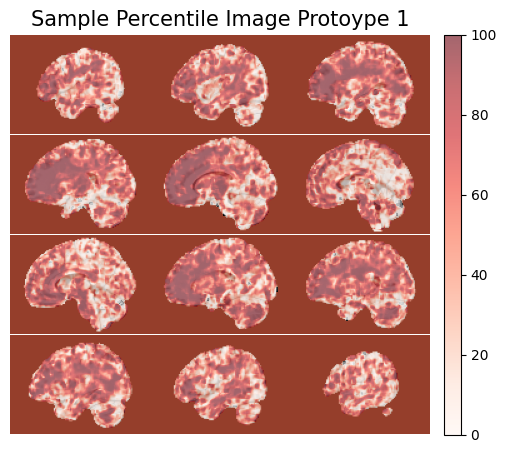

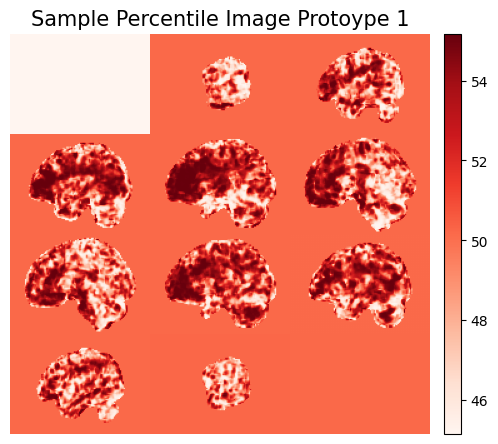

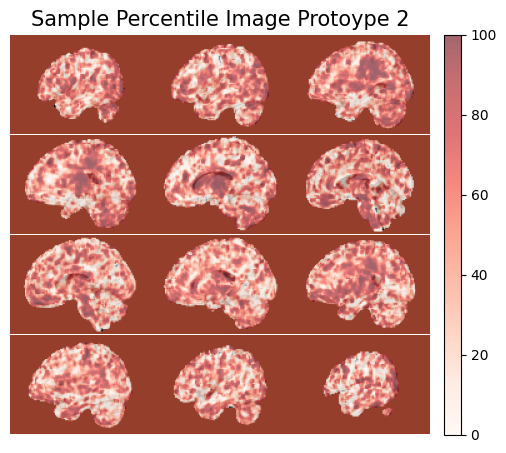

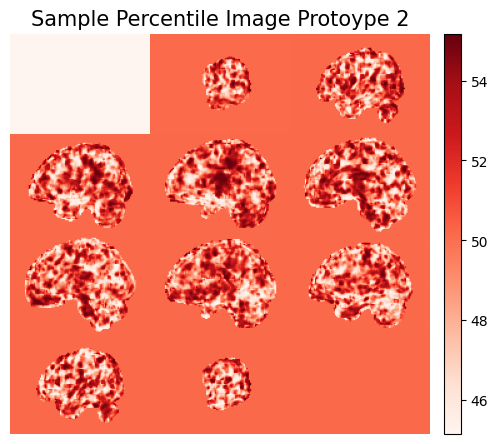

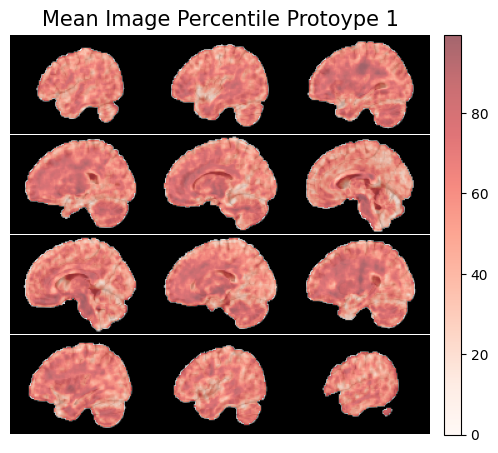

...

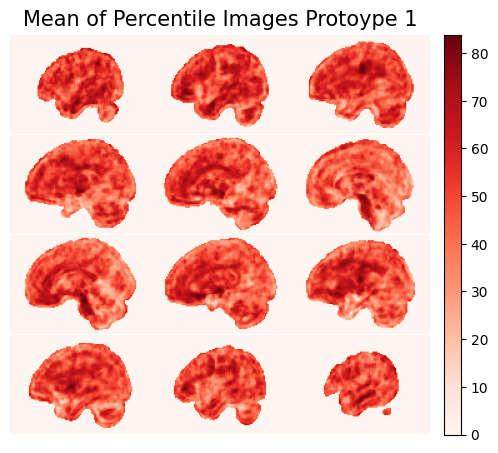

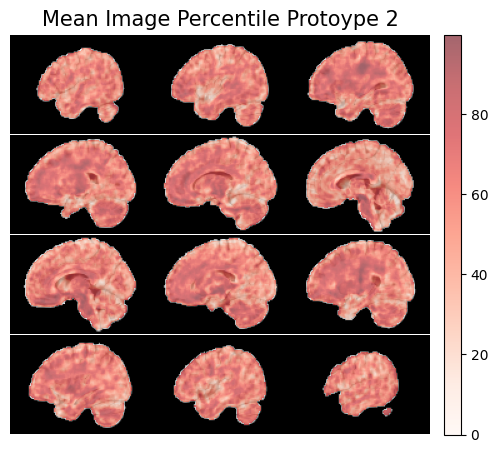

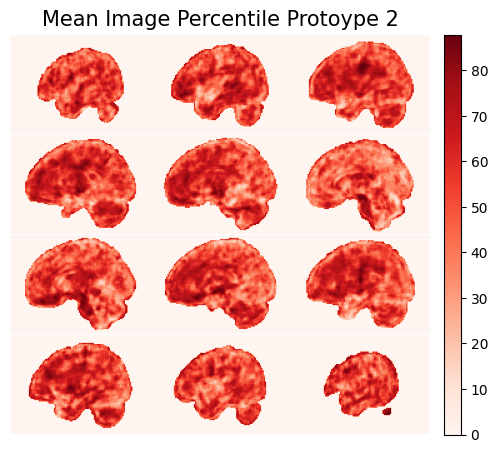

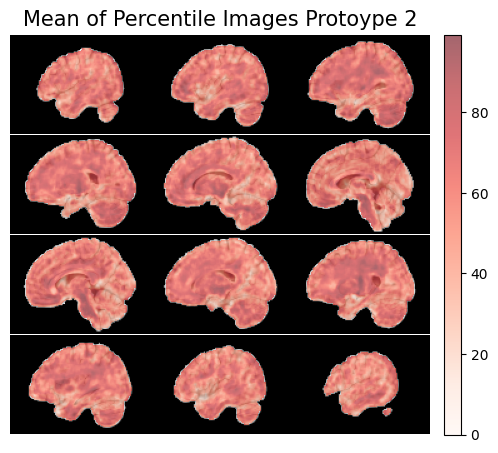

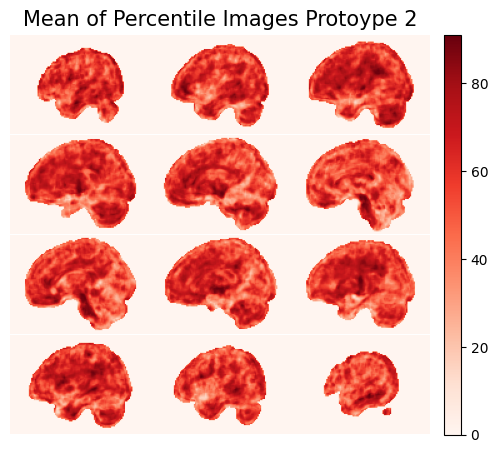

In [30]:
# Function to plot images with ref_img_post_transform
def plot_image(heatmap, title="Percentile Image"):
    
    ants.plot(ref_img_post_transform, overlay=heatmap, overlay_cmap="Reds", overlay_alpha=0.6, title=title, cbar=True, black_bg=True,figsize=1,title_fontsize=15)
    ants.plot(heatmap, cmap="Reds", title=title, cbar=True, black_bg=True,figsize=1,title_fontsize=15)

# Plot an individual percentile image
plot_image(percentile_images_prt1[0], title="Sample Percentile Image Protoype 1")
plot_image(percentile_images_prt2[0], title="Sample Percentile Image Protoype 2")

# Plot mean percentile images using both methods
plot_image(mean_percentile_image_1t_prt1, title="Mean Image Percentile Protoype 1")
plot_image(mean_percentile_image_2t_prt1, title="Mean of Percentile Images Protoype 1")

plot_image(mean_percentile_image_1t_prt2, title="Mean Image Percentile Protoype 2")
plot_image(mean_percentile_image_2t_prt2, title="Mean of Percentile Images Protoype 2")

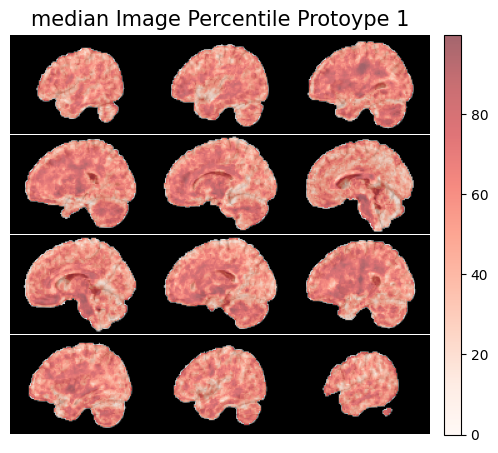

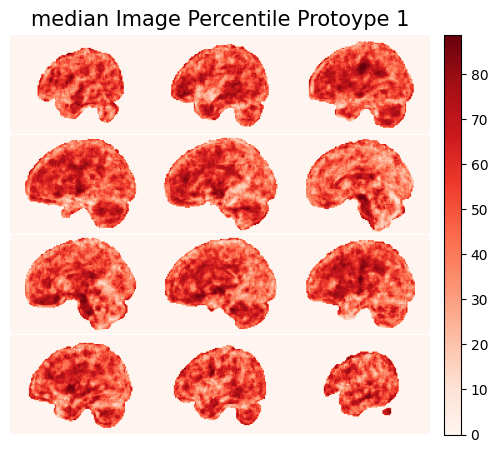

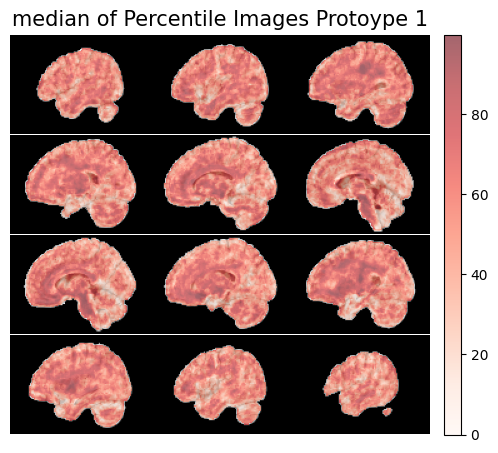

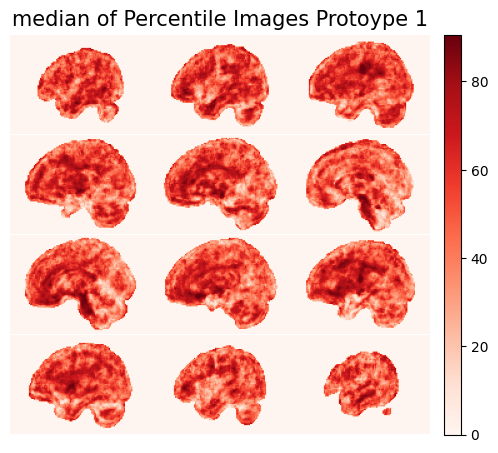

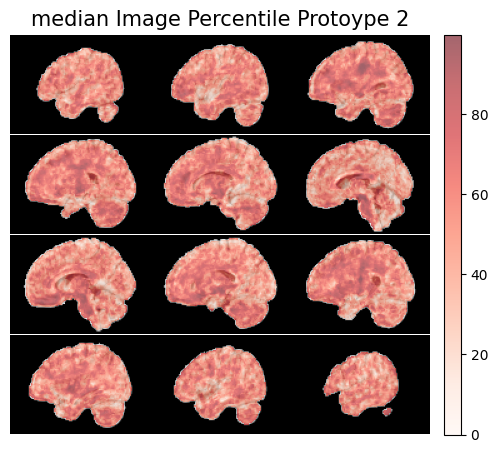

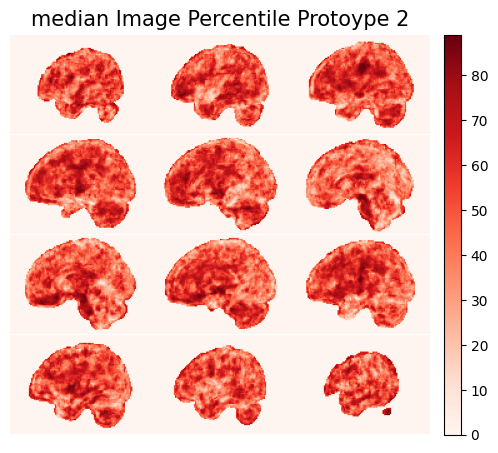

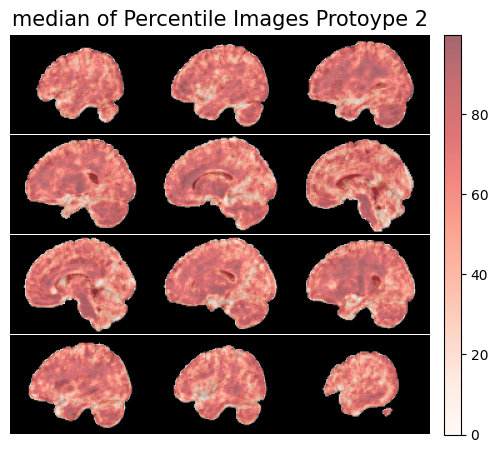

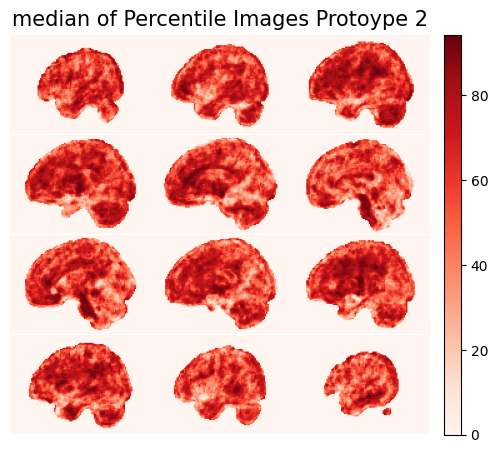

In [31]:
# Plot median percentile images using both methods
plot_image(median_percentile_image_1t_prt1, title="median Image Percentile Protoype 1")
plot_image(median_percentile_image_2t_prt1, title="median of Percentile Images Protoype 1")

plot_image(median_percentile_image_1t_prt2, title="median Image Percentile Protoype 2")
plot_image(median_percentile_image_2t_prt2, title="median of Percentile Images Protoype 2")

In [32]:
ref_img_post_transform

ANTsImage (RAI)
	 Pixel Type : float (float32)
	 Components : 1
	 Dimensions : (96, 112, 80)
	 Spacing    : (1.0, 1.0, 1.0)
	 Origin     : (0.0, 0.0, 0.0)
	 Direction  : [1. 0. 0. 0. 1. 0. 0. 0. 1.]

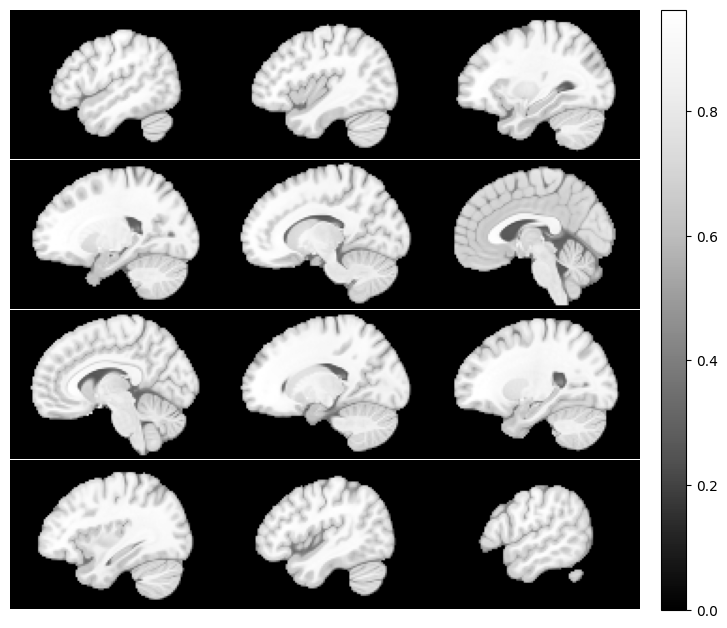

In [33]:
ants.plot(ref_img_post_transform, cbar=True)

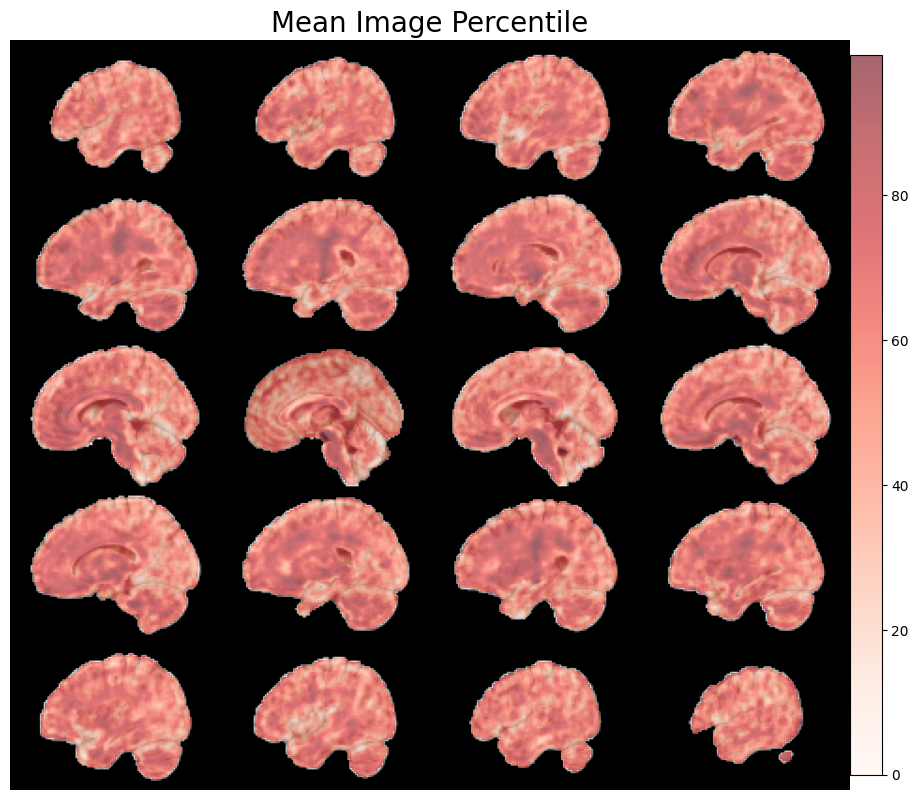

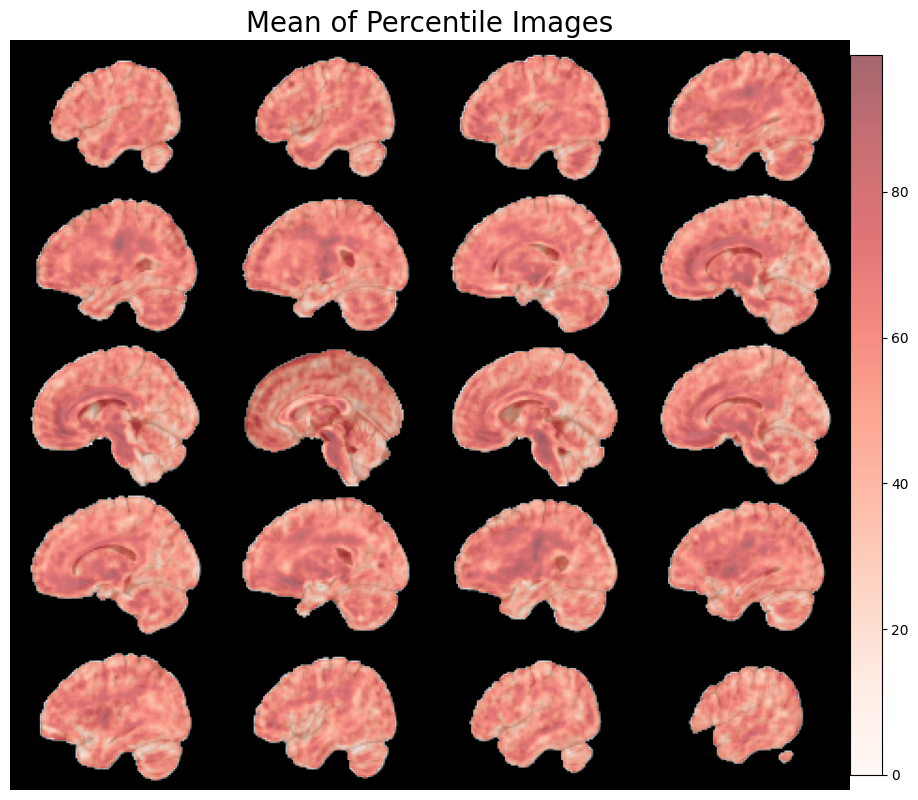

In [34]:
ants.plot(ref_img_post_transform, overlay=mean_percentile_image_1t_prt1, overlay_cmap="Reds", overlay_alpha=0.6, title="Mean Image Percentile", cbar=True, black_bg=True, nslices=20)
ants.plot(ref_img_post_transform, overlay=mean_percentile_image_2t_prt1, overlay_cmap="Reds", overlay_alpha=0.6, title="Mean of Percentile Images", cbar=True, black_bg=True, nslices=20)

In [35]:
# ants.plot(ref_img_post_transform, overlay=mean_percentile_image_1t_prt1, overlay_cmap="Reds", overlay_alpha=0.9, title="Mean Image Percentile", cbar=True, nslices=20)
# ants.plot(ref_img_post_transform, overlay=mean_percentile_image_2t_prt1, overlay_cmap="Reds", overlay_alpha=0.9, title="Mean of Percentile Images", cbar=True, nslices=20)

In [36]:
from matplotlib.colors import Normalize
import matplotlib.colors as mcolors

In [37]:
cmap_name_1 = "OrRd" # 
cmap_name_2 = "gist_heat"
cmap_name_3 = "hot"
cmap_name_4 = "YlOrRd"
cmap_name_5 = "plasma"
cmap_name_6 = "inferno"

# Create test data
x = np.linspace(0, 1, 256)  # Linear range from 0 to 1

# Apply non-linear transformation
adjusted_x = np.exp(x) -1.5 #np.power(x, 4) # Slower change at low values, faster at high values

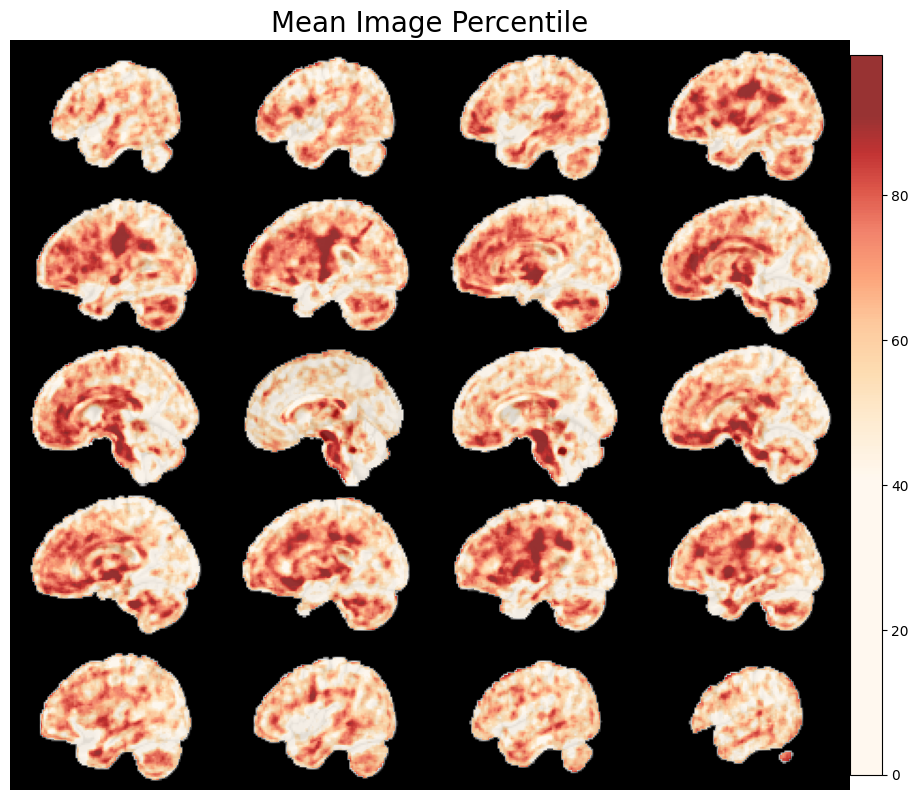

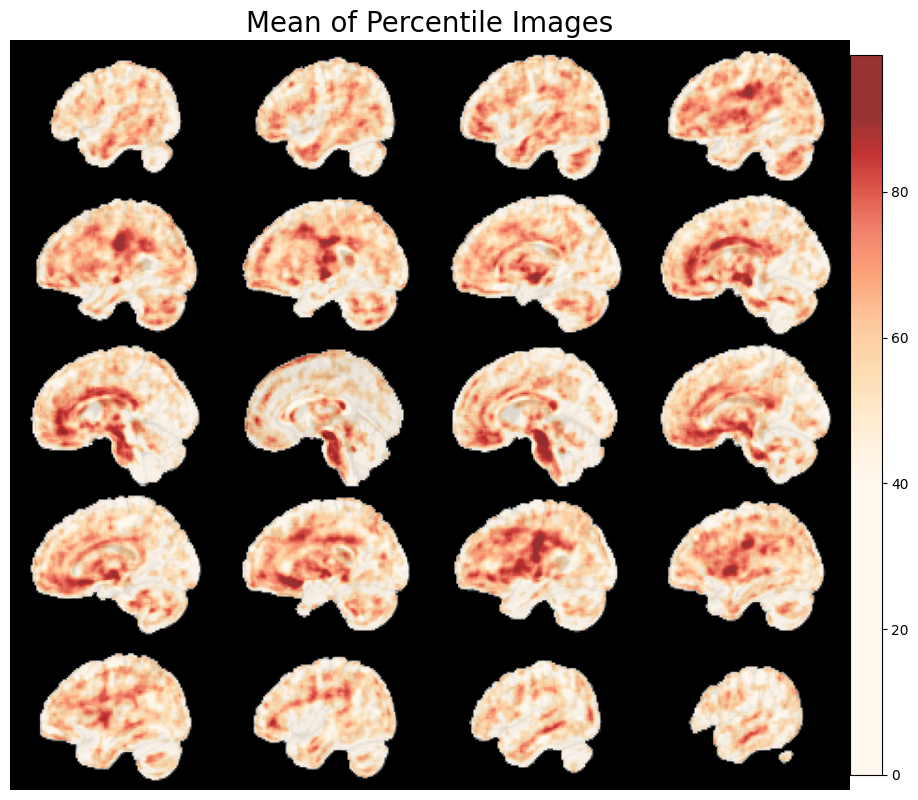

In [38]:
# Create a custom colormap
cmap = plt.get_cmap(cmap_name_1)  # Choose a base colormap
new_cmap = mcolors.LinearSegmentedColormap.from_list("adjusted_viridis", cmap(adjusted_x))

ants.plot(ref_img_post_transform, overlay=mean_percentile_image_1t_prt1, overlay_cmap=new_cmap, overlay_alpha=0.8, title="Mean Image Percentile", cbar=True, nslices=20)
ants.plot(ref_img_post_transform, overlay=mean_percentile_image_2t_prt1, overlay_cmap=new_cmap, overlay_alpha=0.8, title="Mean of Percentile Images", cbar=True, nslices=20)

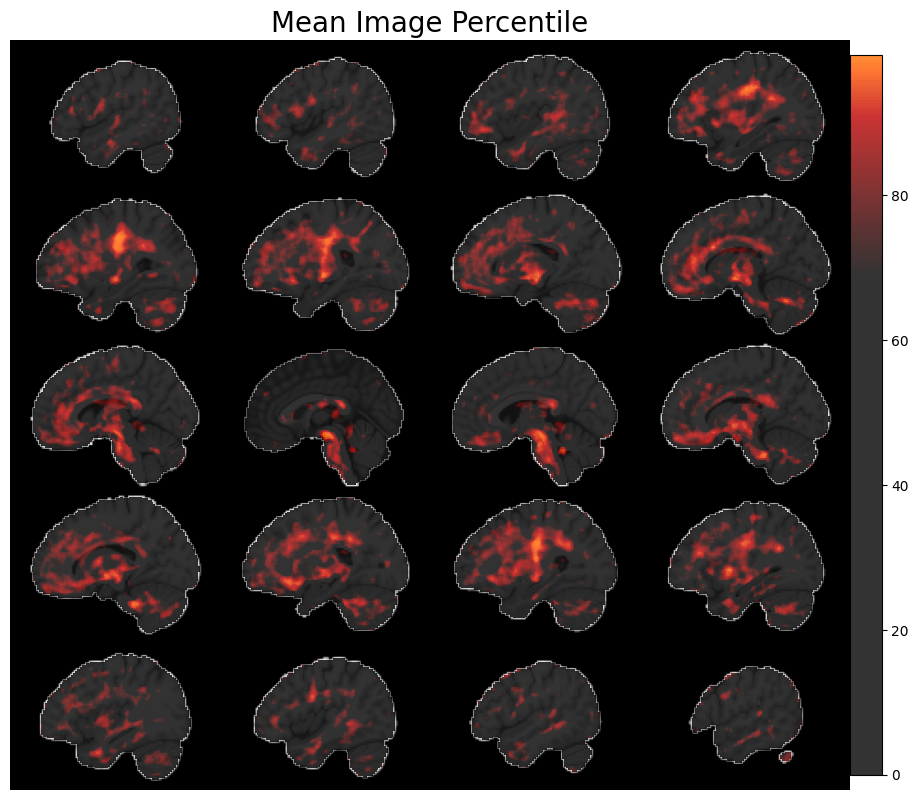

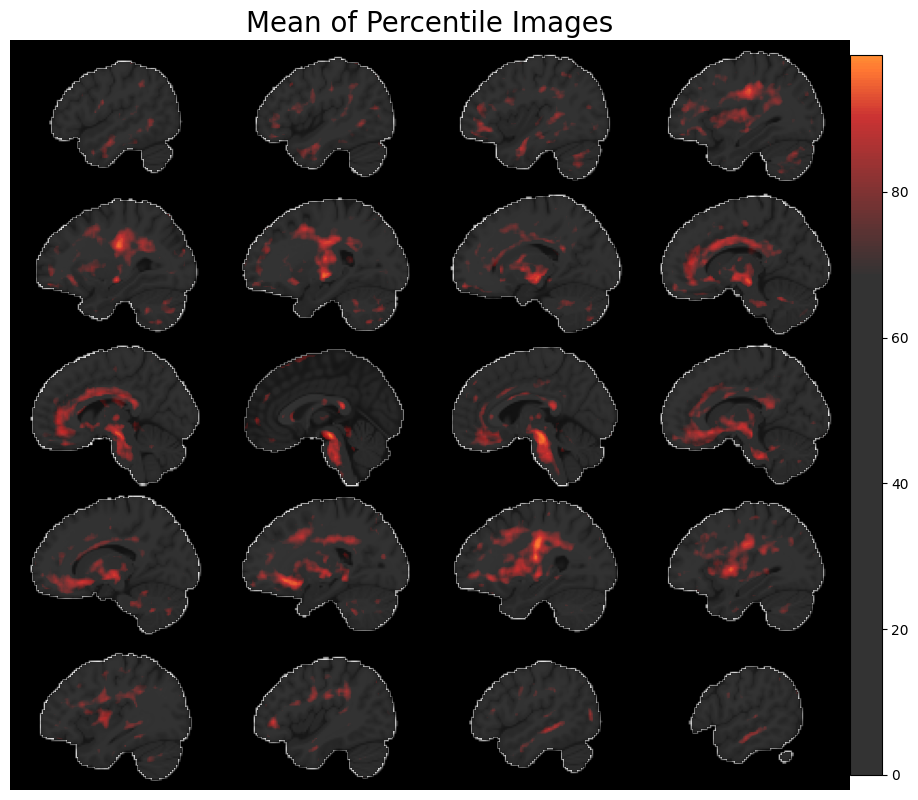

In [39]:
adjusted_x = np.exp(x) -2.0 

# Create a custom colormap
cmap = plt.get_cmap(cmap_name_2)  # Choose a base colormap
new_cmap = mcolors.LinearSegmentedColormap.from_list("adjusted_viridis", cmap(adjusted_x))

ants.plot(ref_img_post_transform, overlay=mean_percentile_image_1t_prt1, overlay_cmap=new_cmap, overlay_alpha=0.8, title="Mean Image Percentile", cbar=True, nslices=20)
ants.plot(ref_img_post_transform, overlay=mean_percentile_image_2t_prt1, overlay_cmap=new_cmap, overlay_alpha=0.8, title="Mean of Percentile Images", cbar=True, nslices=20)

## HOT

In [40]:
x = np.linspace(0, 1.1, 256)  # Linear range from 0 to 1

# Apply non-linear transformation
adjusted_x = np.exp(x) -2.1 #np.power(x, 4) # Slower change at low values, faster at high values

# Create a custom colormap
cmap = plt.get_cmap(cmap_name_3)  # Choose a base colormap
new_cmap = mcolors.LinearSegmentedColormap.from_list("adjusted_viridis", cmap(adjusted_x))
if False: # True: # display all options
    ants.plot(ref_img_post_transform, overlay=mean_percentile_image_1t_prt1, overlay_cmap=new_cmap, overlay_alpha=0.7, title="Mean Image Percentile - Protoype 1", cbar=True, nslices=9,figsize=1,title_fontsize=15)
    ants.plot(ref_img_post_transform, overlay=median_percentile_image_1t_prt1, overlay_cmap=new_cmap, overlay_alpha=0.7, title="Median Image Percentile - Protoype 1", cbar=True, nslices=9,figsize=1,title_fontsize=15)

    ants.plot(ref_img_post_transform, overlay=mean_percentile_image_2t_prt1, overlay_cmap=new_cmap, overlay_alpha=0.7, title="Mean of Percentile Images - Protoype 1", cbar=True, nslices=9,figsize=1,title_fontsize=15)
    ants.plot(ref_img_post_transform, overlay=median_percentile_image_2t_prt1, overlay_cmap=new_cmap, overlay_alpha=0.7, title="Median of Percentile Images - Protoype 1", cbar=True, nslices=9,figsize=1,title_fontsize=15)

    ants.plot(ref_img_post_transform, overlay=mean_percentile_image_1t_prt2, overlay_cmap=new_cmap, overlay_alpha=0.7, title="Mean Image Percentile - Protoype 2", cbar=True, nslices=9,figsize=1,title_fontsize=15)
    ants.plot(ref_img_post_transform, overlay=median_percentile_image_1t_prt2, overlay_cmap=new_cmap, overlay_alpha=0.7, title="Median Image Percentile - Protoype 2", cbar=True, nslices=9,figsize=1,title_fontsize=15)

    ants.plot(ref_img_post_transform, overlay=mean_percentile_image_2t_prt2, overlay_cmap=new_cmap, overlay_alpha=0.7, title="Mean of Percentile Images - Protoype 2", cbar=True, nslices=9,figsize=1,title_fontsize=15)
    ants.plot(ref_img_post_transform, overlay=median_percentile_image_2t_prt2, overlay_cmap=new_cmap, overlay_alpha=0.7, title="Median of Percentile Images - Protoype 2", cbar=True, nslices=9,figsize=1,title_fontsize=15)

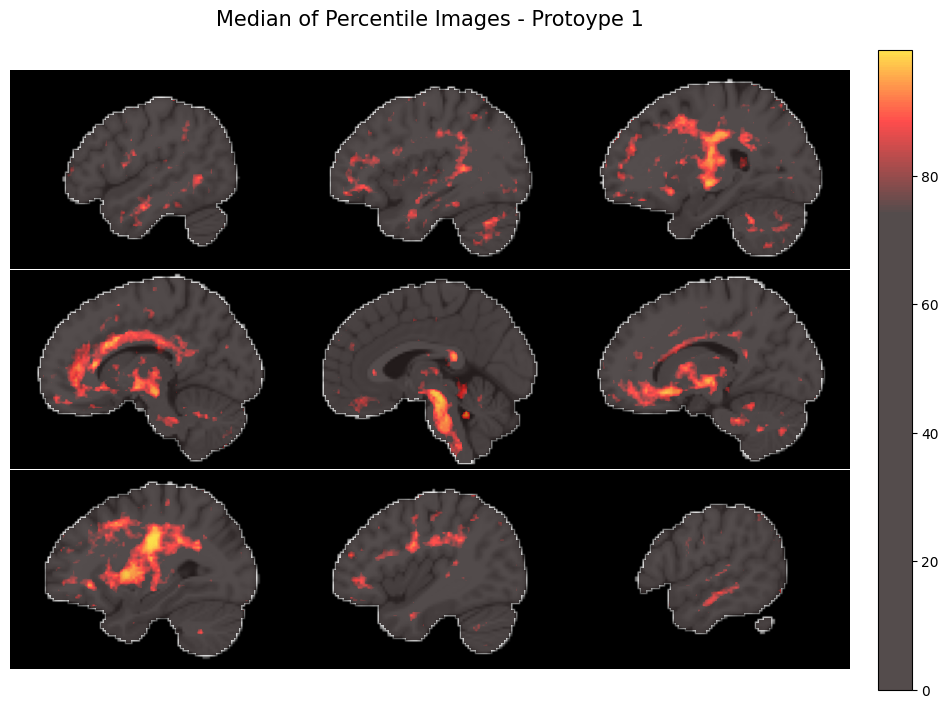

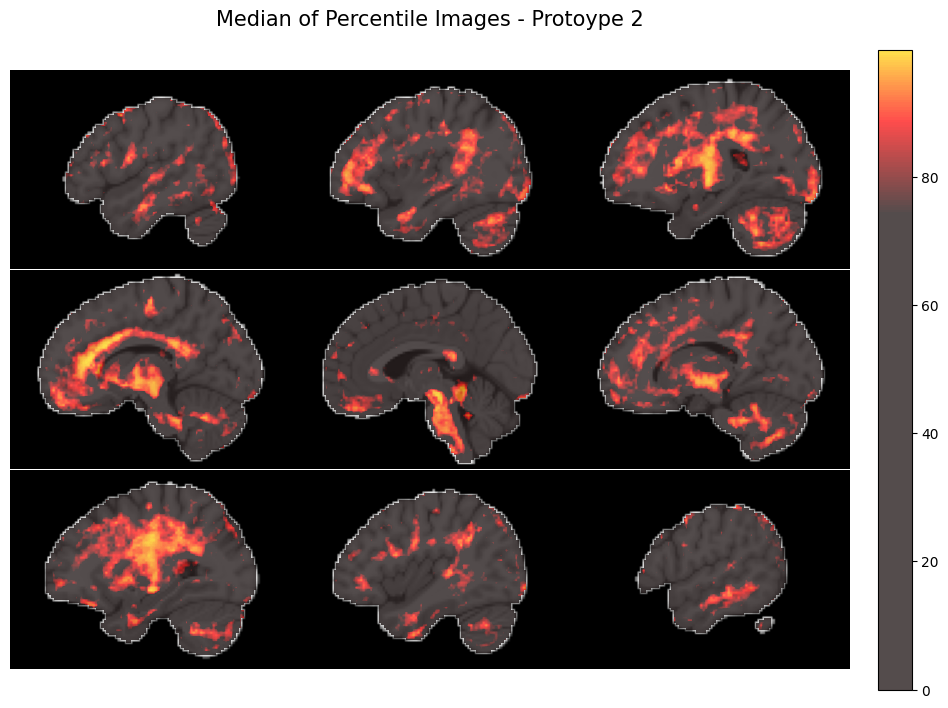

In [41]:
x = np.linspace(0, 1.06, 256)  # Linear range from 0 to 1

# Apply non-linear transformation
adjusted_x = np.exp(x) -2.2 #np.power(x, 4) # Slower change at low values, faster at high values

# Create a custom colormap
cmap = plt.get_cmap(cmap_name_3)  # Choose a base colormap
new_cmap = mcolors.LinearSegmentedColormap.from_list("adjusted_viridis", cmap(adjusted_x))

ants.plot(ref_img_post_transform, overlay=median_percentile_image_2t_prt1, overlay_cmap=new_cmap, overlay_alpha=0.7, title="Median of Percentile Images - Protoype 1", cbar=True, nslices=9,figsize=2,title_fontsize=15)
ants.plot(ref_img_post_transform, overlay=median_percentile_image_2t_prt2, overlay_cmap=new_cmap, overlay_alpha=0.7, title="Median of Percentile Images - Protoype 2", cbar=True, nslices=9,figsize=2,title_fontsize=15)

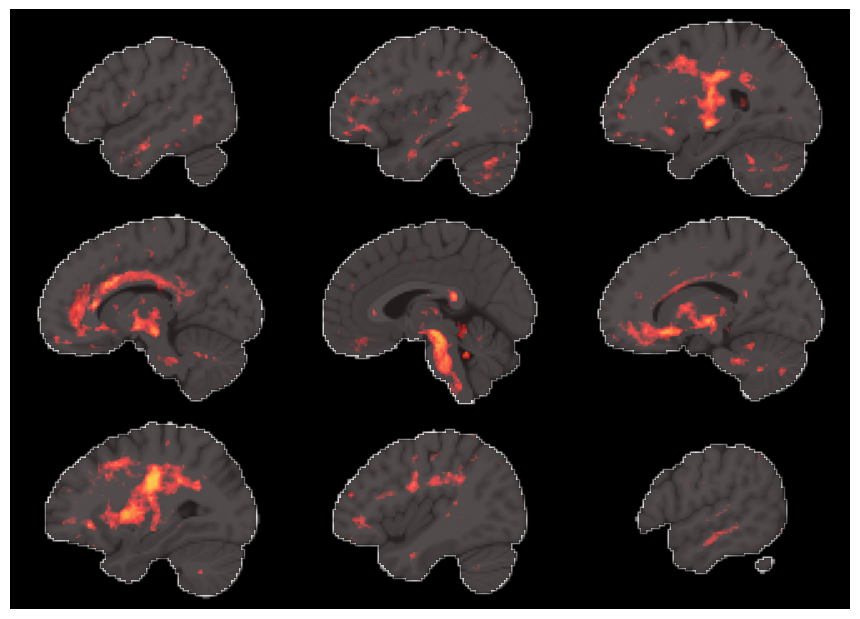

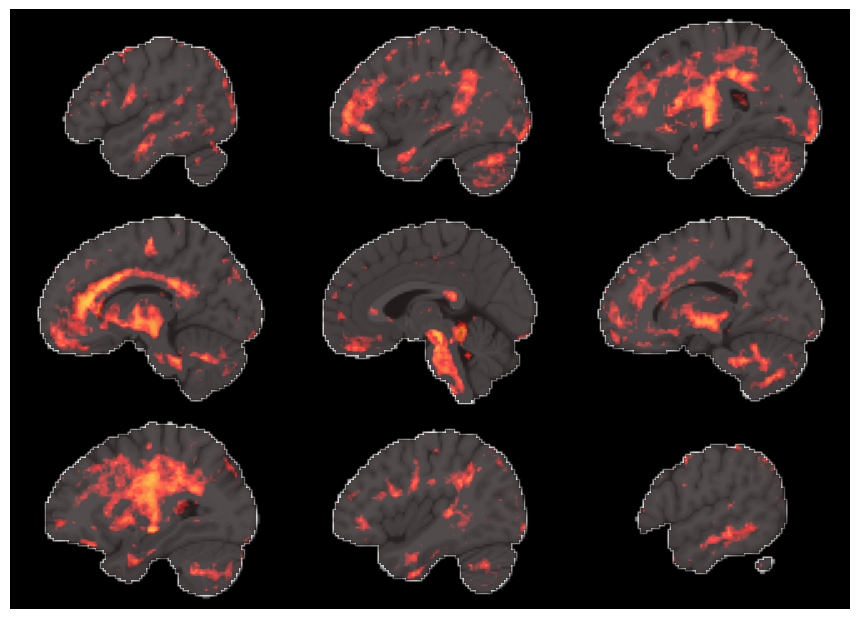

In [42]:
x = np.linspace(0, 1.06, 256)  # Linear range from 0 to 1

# Apply non-linear transformation
adjusted_x = np.exp(x) -2.25 #np.power(x, 4) # Slower change at low values, faster at high values

# Create a custom colormap
cmap = plt.get_cmap(cmap_name_3)  # Choose a base colormap
new_cmap = mcolors.LinearSegmentedColormap.from_list("adjusted_viridis", cmap(adjusted_x))

ants.plot(ref_img_post_transform, overlay=median_percentile_image_2t_prt1, overlay_cmap=new_cmap, overlay_alpha=0.7, cbar=False, nslices=9,figsize=2,title_fontsize=15)
ants.plot(ref_img_post_transform, overlay=median_percentile_image_2t_prt2, overlay_cmap=new_cmap, overlay_alpha=0.7, cbar=False, nslices=9,figsize=2,title_fontsize=15)

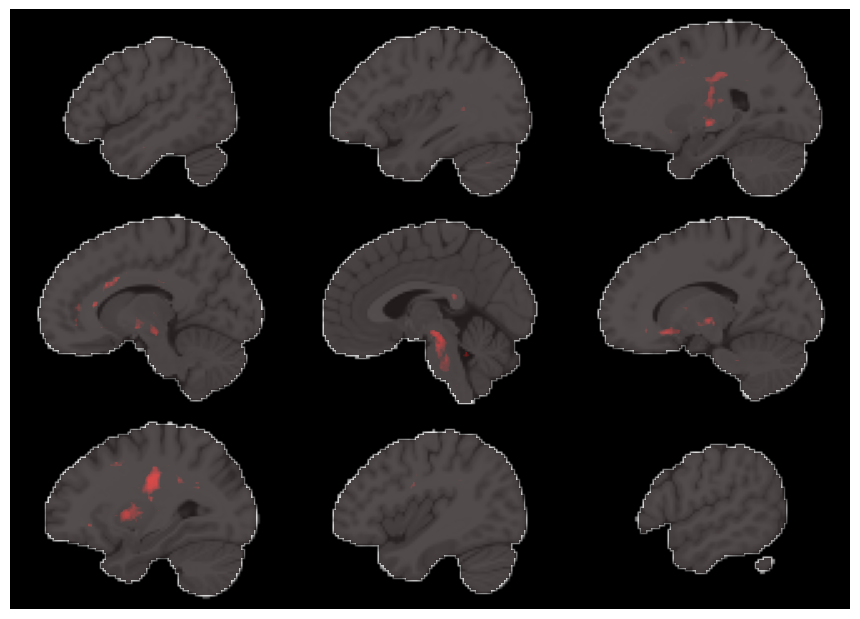

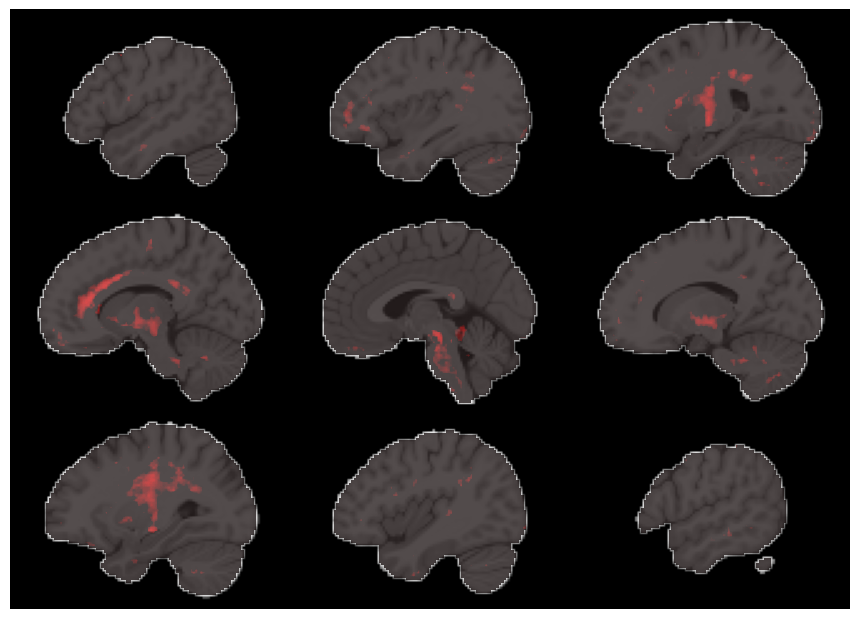

In [43]:
x = np.linspace(0, 1.06, 256)  # Linear range from 0 to 1

# Apply non-linear transformation
adjusted_x = np.exp(x) -2.6 #np.power(x, 4) # Slower change at low values, faster at high values

# Create a custom colormap
cmap = plt.get_cmap(cmap_name_3)  # Choose a base colormap
new_cmap = mcolors.LinearSegmentedColormap.from_list("adjusted_viridis", cmap(adjusted_x))

ants.plot(ref_img_post_transform, overlay=median_percentile_image_2t_prt1, overlay_cmap=new_cmap, overlay_alpha=0.7, cbar=False, nslices=9,figsize=2,title_fontsize=15)
ants.plot(ref_img_post_transform, overlay=median_percentile_image_2t_prt2, overlay_cmap=new_cmap, overlay_alpha=0.7, cbar=False, nslices=9,figsize=2,title_fontsize=15)

In [44]:
# Create a custom colormap
cmap = plt.get_cmap(cmap_name_4)  # Choose a base colormap
new_cmap = mcolors.LinearSegmentedColormap.from_list("adjusted_viridis", cmap(adjusted_x))

# ants.plot(ref_img_post_transform, overlay=mean_percentile_image_1t_prt1, overlay_cmap=new_cmap, overlay_alpha=0.8, title="Mean Image Percentile", cbar=True, nslices=20)
# ants.plot(ref_img_post_transform, overlay=mean_percentile_image_2t_prt1, overlay_cmap=new_cmap, overlay_alpha=0.8, title="Mean of Percentile Images", cbar=True, nslices=20)

In [45]:
# Create a custom colormap
cmap = plt.get_cmap(cmap_name_5)  # Choose a base colormap
new_cmap = mcolors.LinearSegmentedColormap.from_list("adjusted_viridis", cmap(adjusted_x))

# ants.plot(ref_img_post_transform, overlay=mean_percentile_image_1t_prt1, overlay_cmap=new_cmap, overlay_alpha=0.8, title="Mean Image Percentile", cbar=True, nslices=20)
# ants.plot(ref_img_post_transform, overlay=mean_percentile_image_2t_prt1, overlay_cmap=new_cmap, overlay_alpha=0.8, title="Mean of Percentile Images", cbar=True, nslices=20)

In [46]:
# Create a custom colormap
cmap = plt.get_cmap(cmap_name_6)  # Choose a base colormap
new_cmap = mcolors.LinearSegmentedColormap.from_list("adjusted_viridis", cmap(adjusted_x))

# ants.plot(ref_img_post_transform, overlay=mean_percentile_image_1t_prt1, overlay_cmap=new_cmap, overlay_alpha=0.8, title="Mean Image Percentile", cbar=True, nslices=20)
# ants.plot(ref_img_post_transform, overlay=mean_percentile_image_2t_prt1, overlay_cmap=new_cmap, overlay_alpha=0.8, title="Mean of Percentile Images", cbar=True, nslices=20)